# **This is a method to install kaggle datasets into google colab without mounting google drive.**

In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files

In [ ]:
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"ahmedsohail2000","key":"f8e8be315b75368980e7af4189cec6b6"}'}

In [ ]:
! mkdir ~/.kaggle


mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
! cp kaggle.json ~/.kaggle/


In [ ]:
! chmod 600 ~/.kaggle/kaggle.json


In [ ]:
! kaggle datasets list

ref                                                             title                                              size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  ------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
ahsan81/hotel-reservations-classification-dataset               Hotel Reservations Dataset                        480KB  2023-01-04 12:50:31           4761        173  1.0              
senapatirajesh/netflix-tv-shows-and-movies                      Latest Netflix TV shows and movies                  1MB  2023-01-14 17:03:12           1306         38  0.88235295       
johnny1994/divorce-rates-data-should-you-get-married            Divorce Rates Data: Should You Get Married?        22KB  2023-01-15 12:49:06            787         31  0.88235295       
rakkesharv/spotify-top-10000-streamed-songs                     Spotif

In [ ]:
! kaggle competitions download -c 'dog-breed-identification'

100% 688M/691M [00:21<00:00, 33.4MB/s]
100% 691M/691M [00:21<00:00, 33.0MB/s]


In [ ]:
# Unzip the uploaded data into google colab workspace.
! unzip dog-breed-identification.zip

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

# 🐶 End-To-End Multi-Class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.0 and TensorFlow hub.

## 1. Problem 

Identifying the breed of the dog given the image of a dog.

When I'm sitting at the cafe and I take a photo of the dog, I want to know what breed it is.

## 2. Data

The data we are using is from Kaggle's dog-breed-identification competition: https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed for each test image.

https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning and transfer learning
* There are 120 breeds of dogs (this means that there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000_ images in the test set (these images have no labels because we would want to predict them).


### Get Our Workspace Ready!!!

* Import TensorFlow 2.X ✅
* Import TensorFlow Hub ✅
* Make sure we are using a GPU ✅

In [ ]:
# Import TensorFlow 2.0 and necessary tools into Colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF Version:', tf.__version__)
print('TF Hub Version:', hub.__version__)

# Check for GPU availability 
print('GPU', 'available (YESSSS)' if tf.config.list_physical_devices('GPU') else 'not available :(')


TF Version: 2.9.2
TF Hub Version: 0.12.0
GPU available (YESSSS)


## Getting our data ready (turning it into tensors)

with all machine learning models, our data has to be in numerical format. So that's what we will be doing first. Turning images into Tensors (Numerical representation)

Let's start by accessing our data and checking out the labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv('labels.csv')
labels_csv.describe(), labels_csv.head()

(                                      id               breed
 count                              10222               10222
 unique                             10222                 120
 top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
 freq                                   1                 126,
                                  id             breed
 0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
 1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
 2  001cdf01b096e06d78e9e5112d419397          pekinese
 3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
 4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever)

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


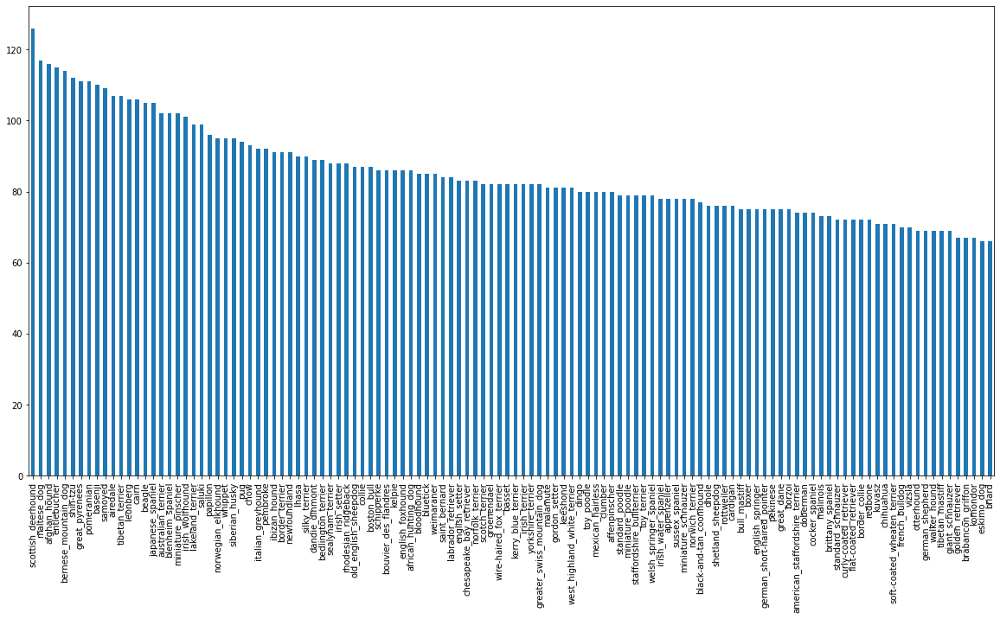

In [ ]:
# How many images are there in each breed?
labels_csv['breed'].value_counts().plot.bar(figsize = (20,10));

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

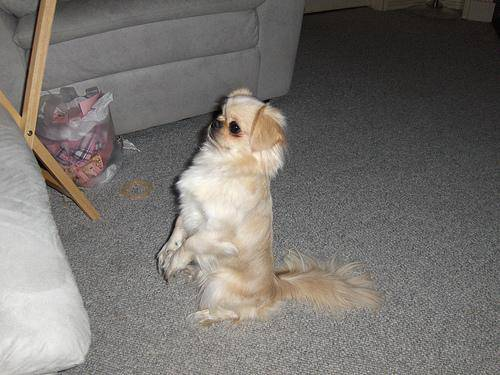

In [ ]:
# Let's view an image
from IPython.display import Image
Image('train/001cdf01b096e06d78e9e5112d419397.jpg')

### Getting images and their labels

Let's get a list of all our image file pathnames.


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from image ID's
filenames = ['train/'+  fname + '.jpg' for fname in labels_csv['id']]

# Check the first 10
filenames[:10]

['train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'train/001cdf01b096e06d78e9e5112d419397.jpg',
 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'train/002a283a315af96eaea0e28e7163b21b.jpg',
 'train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'train/0042188c895a2f14ef64a918ed9c7b64.jpg']

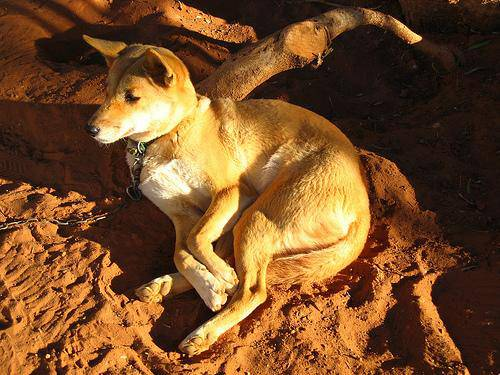

In [ ]:
Image(filenames[1])

In [ ]:
# Check whether number of filenames matches with actual number of image files
import os
if len(os.listdir('train')) == len(filenames):
  print('The filenames matches with actual image files. Proceed!!!')
else:
  print('The filenames does not match with the actual number of image files. Check the target directory')

The filenames matches with actual image files. Proceed!!!


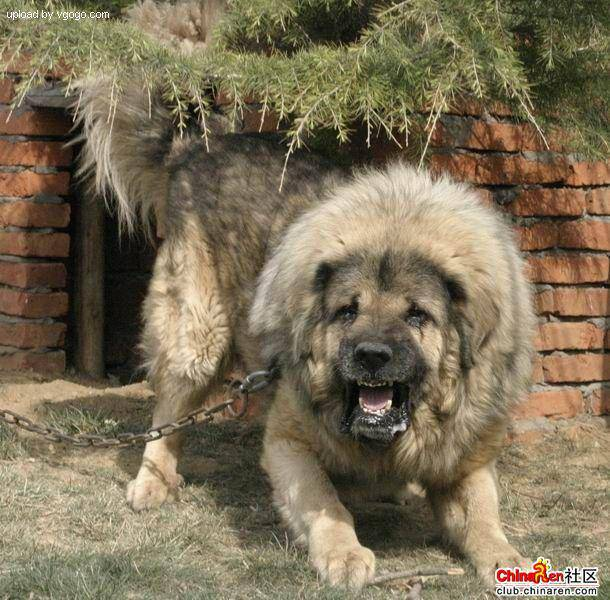

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we have not got our training image files in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv['breed'].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if the number of labels matches with the number of filenames
if len(labels) == len(filenames):
  print('Match')
else:
  print('Does not match')

Match


In [ ]:
# Find the unique label values
unique_breeds = np.unique(labels)
unique_breeds, len(unique_breeds)


(array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
        'american_staffordshire_terrier', 'appenzeller',
        'australian_terrier', 'basenji', 'basset', 'beagle',
        'bedlington_terrier', 'bernese_mountain_dog',
        'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
        'bluetick', 'border_collie', 'border_terrier', 'borzoi',
        'boston_bull', 'bouvier_des_flandres', 'boxer',
        'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
        'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
        'chow', 'clumber', 'cocker_spaniel', 'collie',
        'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
        'doberman', 'english_foxhound', 'english_setter',
        'english_springer', 'entlebucher', 'eskimo_dog',
        'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
        'german_short-haired_pointer', 'giant_schnauzer',
        'golden_retriever', 'gordon_setter', 'gre

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into an array of booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example turning boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there should be a 1 where a sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from kaggle doesnt come with a validation set, we are going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting a ~1000 images and increase as needed.

In [ ]:
# Set number of images to use for experimenting 
NUM_IMAGES = 1000 # @param {type: 'slider', min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation set
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES
X_train, X_val, y_train, y_val = train_test_split(X[: NUM_IMAGES],
                                                  y[: NUM_IMAGES], 
                                                  test_size = 0.2,
                                                  random_state = 42) 
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:2], y_train[:2]

(['train/00bee065dcec471f26394855c5c2f3de.jpg',
  'train/0d2f9e12a2611d911d91a339074c8154.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)

To preprocess our images into tensors, we're going to write a function which does a few things:

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, `image`.
3. Turn our `image` (a jpg) into 
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the `image` to be a shape of (224, 224)
6. Return the modified `image`

Before we do, let's see what importing an image would look like

In [ ]:
# Convert an image into NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
tf.constant(image[:2])

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now we've seen what an image looks like as a tensor. Let's make a function to preprocess them.

1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable, image.
3. Turn our image (a jpg) into Tensors
4. Normalize our image (convert color channel values from 0-255 to 0-1)
5. Resize the image to be a shape of (224, 224)
6. Return the modified image

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size = IMG_SIZE):
  '''
  Takes an image filepath and turns the image into a tensor.
  '''
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpg image into numerical tensor with 3 color channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

Let's say you are trying to process 10,000+ images in one go...they all might not fit into memory.

So that's why we do about 32 images (batch size) at a time. You can manually adjust the batch size if need be.

In order to use TensorFlow effectively. We need our data in the form of tensors tuples which look like this: `(image, label)`

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  '''
  Takes an image filepath name and associated label, processes the image and returns a tuple of (image, label)
  '''
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above
(process_image(X[42], tf.constant(y[42])))

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.3264178 , 0.5222886 , 0.3232816 ],
        [0.2537167 , 0.44366494, 0.24117757],
        [0.25699762, 0.4467087 , 0.23893751],
        ...,
        [0.29325107, 0.5189916 , 0.3215547 ],
        [0.29721776, 0.52466875, 0.33030328],
        [0.2948505 , 0.5223015 , 0.33406618]],

       [[0.25903144, 0.4537807 , 0.27294815],
        [0.24375686, 0.4407019 , 0.2554778 ],
        [0.2838985 , 0.47213382, 0.28298813],
        ...,
        [0.2785345 , 0.5027992 , 0.31004712],
        [0.28428748, 0.5108719 , 0.32523635],
        [0.28821915, 0.5148036 , 0.32916805]],

       [[0.20941195, 0.40692952, 0.25792548],
        [0.24045378, 0.43900946, 0.2868911 ],
        [0.29001117, 0.47937486, 0.32247734],
        ...,
        [0.26074055, 0.48414773, 0.30125174],
        [0.27101526, 0.49454468, 0.32096273],
        [0.27939945, 0.5029289 , 0.32934693]],

       ...,

       [[0.00634795, 0.03442048, 0.0258106 ],
        [0.01

Now we have got a way to turn our data into tuples of tensors in the form: (image, label). Let's make a function to turn all of our data (X, y) into batches.

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32
# Create a function that turns data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  '''
  Create batches of data out of image (X) and label (y) pairs. It shuffles the training data but doesn't shuffle if it's a validation data.
   Also accepts test data as input (no labels)
  '''
  # If the data is a test data set, we probably dont have labels
  if test_data:
    print('Creating test data batches...')
    
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    
    return data_batch

  # If the data is a valid dataset, we dont need to shuffle it.
  elif valid_data:
    print('Creating validation data batches...')
    
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y))) #filepaths, labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    
    return data_batch

  else:
    print('Create training data batches...')
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffle the pathnames and labels before mapping image processor as function is faster than shuffling images.
    data = data.shuffle(buffer_size = len(X))

    # Create image, label tuples. This also turns the image path into a pre-processed images.
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_val, y_val, valid_data = True)

Create training data batches...
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches 
train_data.element_spec, valid_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches

our data is now in batches, however, these can be hard to understand and comprehend, let's visualize them


In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  '''
  Displays a plot of 25 images and their labels from a data batch.
  '''
  # Setup the figure
  plt.figure(figsize = (10, 10))
  # Loop through 25 images and labels
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis('off')


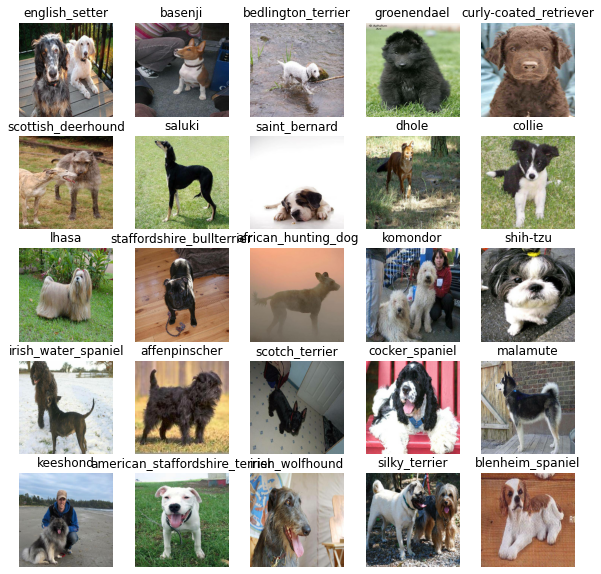

In [ ]:
# Now lets visualize our data in a training batch
train_images, train_labels = next(train_data.as_numpy_iterator()) 
show_25_images(train_images, train_labels)

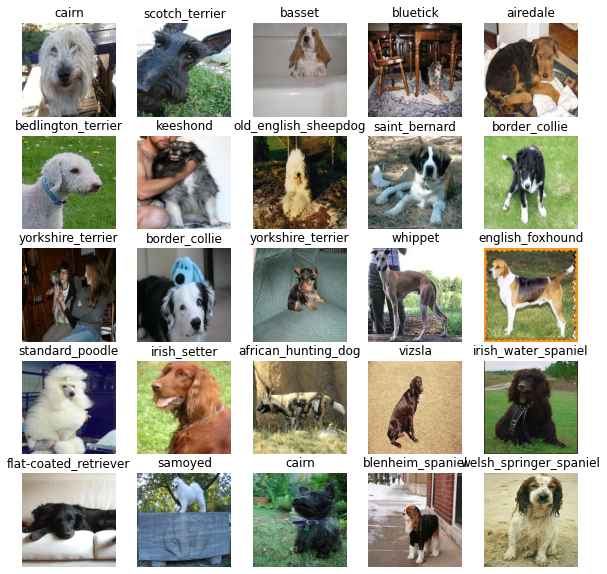

In [ ]:
# Now let's visualize our validation data batch
val_images, val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model
Before we build a model, there are a few things we need to define:

* Input shape (our image shape, in the form of tensors) to our model.
* Ouput shape (our image labels, in the form of tensors) to our model.
* The URL of the model we want to use from TensorFlow Hub: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [ ]:
# Setup input shape to the model.
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # Batch, height, width, color channels

# Setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now that we've got our inputs and outputs of the model ready to go. Let's put them together into Keras deep learning model. 

Knowing this, let's create a function which:
* Takes the input shape, output shape, and the model we have chosen as parameters. 
* Defines the layers in a Keras model in sequential fashion (do this first, then this, and then that)
* Compiles the model (says it should be evaluated and improved)
* Builds the model (tells the model the input shape it will be getting).
* Returns the model.

All of these steps can be found here: https://www.tensorflow.org/guide/keras/sequential_model

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  '''
  Creates a keras model with input, output shapes and model URL. 
  '''
  print('Building model with:', MODEL_URL)

  # Setup model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units = OUTPUT_SHAPE,
                            activation = 'softmax') # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ['accuracy']
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating callbacks

callbacks are helper functions a model can use during training to do such things such as save it's progress, check it's progress or stop training early if the model stops improving. 

We'll create 2 callbacks, one for TensorBoard which helps to track our progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to do three things:
1. Load the TensorBoard extension ✅
2. Create a TensorBoard callback, able to save logs to the directory and pass it to our model's `fit()` function ✅
3. Visualize our models training logs with `%tensorboard` magic function (we wil do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a tensorboard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard Logs
  logdir = os.path.join('logs',
                        # Make it so that the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S')
                       )
  return tf.keras.callbacks.TensorBoard(logdir)


### Early Stopping Callback

Early stopping helps to stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping



In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'val_accuracy',
                                                  patience = 3)

## Training a Model (on a subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type: 'slider', min:10, max:100, step:10} 

In [ ]:
# Check to make sure we are still running on a GPU
print('GPU', 'available (YESSS)' if tf.config.list_physical_devices('GPU') else 'not available')

GPU available (YESSS)


Let's create a function which trains the model

* Create a model using `create_model()`
* Setup a TensorBoard callback using `create_tensor_callback()`
* Call the `fit()` function on our model passing it the training and validation data, number of epochs to train for `NUM_EPOCHS` and the callbacks we'd like to use.
* Return the model


In [ ]:
# Build a function to train and return a trained model
def train_model():
  '''
  Trains a given model and returns the trained version.
  '''
  model = create_model()

  # Create new TensorBoard session everytime we train a model.
  tensorboard = create_tensorboard_callback()
  
  # Fit the model to the data, passing it the callbacks we created.
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping]
            )
  
  # Return the fitted model.
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 14s 136ms/step - loss: 4.5738 - accuracy: 0.1037 - val_loss: 3.4696 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 2s 84ms/step - loss: 1.6420 - accuracy: 0.7125 - val_loss: 2.1435 - val_accuracy: 0.5500
Epoch 3/100
25/25 [==============================] - 2s 92ms/step - loss: 0.5767 - accuracy: 0.9413 - val_loss: 1.6387 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 2s 92ms/step - loss: 0.2579 - accuracy: 0.9900 - val_loss: 1.4348 - val_accuracy: 0.6700
Epoch 5/100
25/25 [==============================] - 2s 84ms/step - loss: 0.1475 - accuracy: 0.9950 - val_loss: 1.3706 - val_accuracy: 0.6650
Epoch 6/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1019 - accuracy: 0.9987 - val_loss: 1.3320 - val_accuracy: 0.6650
Epoch 7/100
25/25 [==============================] -

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than on the validation dataset. What are some of the ways to prevent overfitting in deep learning neural networks.

**Note:** Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir logs 

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model


In [ ]:
valid_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(valid_data, verbose = 1)
predictions

7/7 [==============================] - 1s 69ms/step


array([[2.42393161e-03, 4.26729966e-04, 6.60040649e-04, ...,
        2.59700813e-04, 1.29182197e-04, 3.94890085e-03],
       [7.35331373e-03, 2.69123516e-03, 1.50538124e-02, ...,
        4.63377743e-04, 2.19178875e-03, 1.49173022e-04],
       [3.38734756e-03, 2.71730125e-03, 1.84158387e-03, ...,
        2.55887164e-03, 5.23202871e-05, 1.22370315e-03],
       ...,
       [1.07506048e-05, 3.33109165e-05, 2.99592630e-05, ...,
        3.86292922e-05, 4.79129085e-05, 1.82422547e-04],
       [6.80241967e-03, 3.39106889e-04, 2.56977335e-04, ...,
        1.09233632e-04, 5.33536841e-05, 1.37614915e-02],
       [6.51020091e-05, 1.17163099e-05, 9.40131140e-04, ...,
        1.23726111e-02, 5.35777363e-04, 3.49446520e-04]], dtype=float32)

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f'Max Value (probability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max Index: {np.argmax(predictions[index])}')
print(f'Predicted Label: {unique_breeds[np.argmax(predictions[index])]}')

[4.22972342e-04 8.88967043e-05 6.29806600e-05 2.22329007e-04
 3.22976941e-03 2.31957645e-04 6.37503515e-04 2.15959689e-03
 9.49252676e-03 4.25278656e-02 3.36832425e-04 5.84223308e-05
 2.32611177e-03 7.64888572e-03 2.53745029e-03 1.07687842e-02
 1.09050314e-04 4.79682552e-04 6.59432044e-05 1.32661255e-04
 9.52834234e-05 6.35008153e-04 9.19354279e-05 1.29416745e-04
 1.31568266e-02 3.29370487e-05 8.50262470e-04 5.06145414e-04
 1.19981659e-03 9.80698242e-05 1.34838047e-04 3.29983246e-04
 8.68496791e-05 2.62422800e-05 2.59413733e-04 1.38445917e-04
 1.78925140e-04 1.74414541e-03 1.00335943e-04 3.21323931e-01
 1.42731704e-04 3.59993392e-05 5.22379065e-03 2.06721088e-05
 7.52727094e-04 2.68187505e-05 1.31259585e-04 4.87407699e-04
 1.16095303e-04 5.79425076e-04 7.08532098e-05 3.14411503e-04
 1.24405290e-03 1.55420695e-03 2.98046816e-05 2.95338483e-04
 2.90116353e-04 2.25870128e-04 8.61266526e-05 2.05689343e-04
 2.55796022e-05 9.40600177e-04 5.69069125e-05 4.26529004e-05
 1.24476079e-04 1.198359

In [ ]:
unique_breeds[113]

'walker_hound'

**Question:** Having the above functionality is great, but we want to be able to do it at scale. It would be even better if we could see the image prediction it is being made on.

**Note:** Prediction probabilities are also known as confidence levels

In [ ]:
# Turn prediction probabilities into their respective label
def get_pred_label(prediction_probabilities):
  '''
  Turns an array of prediction probabilities into a label
  '''
  return unique_breeds[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[10])
pred_label

'lakeland_terrier'

Now since our validation data is still in a batch dataset, we will have to unbatch it to make predictions on the validation images and compare those predictions to the validation labels (truth labels).

In [ ]:
valid_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a function to unbatch the batched dataset
def unbatchify(data):
  '''
  Takes a batched dataset of image, label tensors and returns separate arrays of images and labels
  '''
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels
  
# Unbatchify the validation data
valid_images, valid_labels = unbatchify(valid_data)
valid_images[0], valid_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:
* prediction labels
* validation labels (truth labels)
* validation images
 
Let's make some function to make these all a bit more visualized.

We'll create a function which:
* Takes an array of prediction probabilities and an array of truth labels, and an array of images and integers. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label, and the target image on a single plot. ✅

In [ ]:
# Create a function to plot all the parameters above
def plot_pred(prediction_probabilities, labels, images, n = 1):
  '''
  View the prediction, ground truth and image for sample n
  '''
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'
    
  # Chane plot title to be predicted, probability of prediction, and truth label
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob) * 100,
                                    true_label),
                                    color = color)


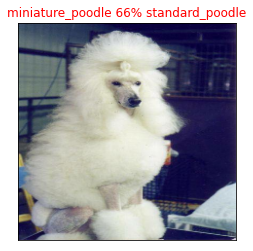

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels = valid_labels,
          images = valid_images,
          n = 15)

Now we've got one function to visualize our model's top predictions, let's make another prediction to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the predicted label using `get_pred_label()` ✅
* Find the top 10:
  * Prediction probabilities indexes ✅
  * Prediction probabilities values ✅
  * Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green. ✅

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  '''
  Plot the top 10 highest prediction confidences along with the truth label for sample n
  '''
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  
  # Change color of the true labels
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
    pass

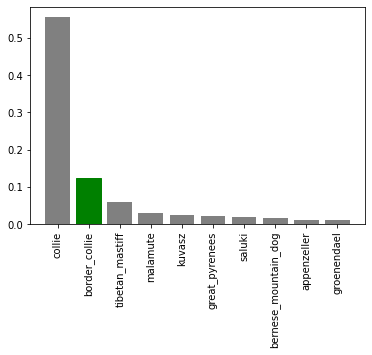

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = valid_labels,
               n = 9)

Now we've got some functions to help us visualize our predictions and evaluate our model, lets check it a few.

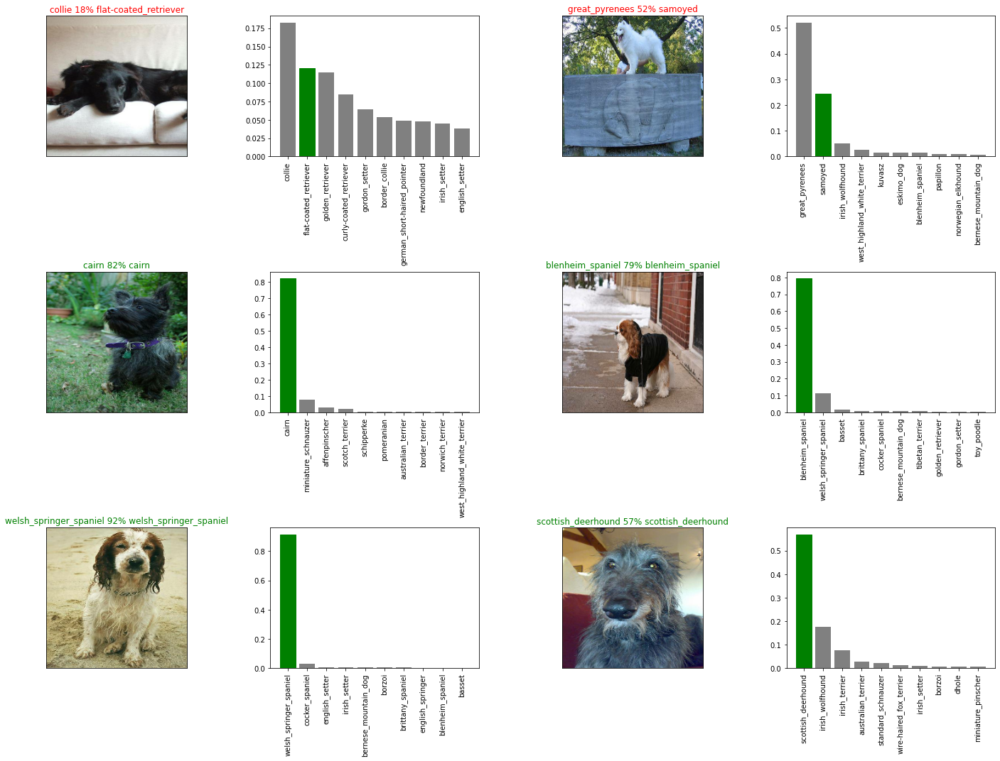

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities = predictions,
            labels = valid_labels,
            images = valid_images,
            n = i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = valid_labels,
                 n = i+i_multiplier)

plt.tight_layout(h_pad = 1.0)
plt.show()

**Challenge:** How would you create a confusion matrix with our models predictions and true labels?

## Saving and reloading a trained model  

In [ ]:
# Create a function to save a model
def save_model(model, suffix = None):
  '''
  saves a given model in a model's directory and appends a suffix (string)
  '''
  # Create a model directory pathname with current time
  modeldir = os.path.join('models',
                          datetime.datetime.now().strftime('%Y%m%d-%HM%s'))
  model_path = modeldir + '-' + suffix + '.h5' # save format of model
  print(f'Saving model to: {model_path}...')
  model.save(model_path)
  
  return model_path

In [ ]:
# Create a function to load a trained model
def load_model(model_path):
  '''
  Loads a saved model from a specified path.
  '''
  print(f'Loading saved model from: {model_path}')
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {'KerasLayer' :hub.KerasLayer})
  
  return model

Now we've got functions to save and load a trained model, let's make sure they work

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix = '1000-images-mobilenetv2-Adam')

Saving model to: models/20230125-09M1674640482-1000-images-mobilenetv2-Adam.h5...


'models/20230125-09M1674640482-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model 
loaded_1000_image_model = load_model('models/20230125-09M1674640482-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: models/20230125-09M1674640482-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(valid_data)

7/7 [==============================] - 1s 63ms/step - loss: 1.2988 - accuracy: 0.6650


[1.2987972497940063, 0.6650000214576721]

In [ ]:
# Evaluate the loaded model
loaded_1000_image_model.evaluate(valid_data)

7/7 [==============================] - 1s 61ms/step - loss: 1.2988 - accuracy: 0.6650


[1.2987972497940063, 0.6650000214576721]

## Training a big dog 🐶 model (on the full data)


In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Create training data batches...


In [ ]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# There is no validation set when training on all the data, so with our early stopping callback, we cant monitor validation accuracy.
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',
                                                             patience = 3)

**Note:** Running the cell below will take a little while, maybe upto 30 minutes or even longer. 30 minutes for the first epoch because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x = full_data,
               epochs = NUM_EPOCHS,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 25s 67ms/step - loss: 1.3169 - accuracy: 0.6777
Epoch 2/100
320/320 [==============================] - 21s 65ms/step - loss: 0.4006 - accuracy: 0.8822
Epoch 3/100
320/320 [==============================] - 21s 66ms/step - loss: 0.2338 - accuracy: 0.9365
Epoch 4/100
320/320 [==============================] - 23s 73ms/step - loss: 0.1520 - accuracy: 0.9651
Epoch 5/100
320/320 [==============================] - 21s 65ms/step - loss: 0.1056 - accuracy: 0.9794
Epoch 6/100
320/320 [==============================] - 21s 64ms/step - loss: 0.0766 - accuracy: 0.9869
Epoch 7/100
320/320 [==============================] - 21s 65ms/step - loss: 0.0571 - accuracy: 0.9923
Epoch 8/100
320/320 [==============================] - 21s 65ms/step - loss: 0.0458 - accuracy: 0.9946
Epoch 9/100
320/320 [==============================] - 21s 66ms/step - loss: 0.0368 - accuracy: 0.9964
Epoch 10/100
320/320 [==============================] - 21s 66ms/step - l

In [ ]:
save_model(full_model, suffix = 'full-image-set-mobilenetv2-Adam')

Saving model to: models/20230125-10M1674641100-full-image-set-mobilenetv2-Adam.h5...


'models/20230125-10M1674641100-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load in the full model
loaded_full_model = load_model('models/20230125-10M1674641100-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: models/20230125-10M1674641100-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test datast

Since our model has been trained on images in the form of tensor batches, but to make predictions on the test data, we would have to get it into the same format.

Luckily we created `create_data_batches()` earlier which can take a list of filenames as input and convert them into tensor batches.

To make predictions on the test data, we'll:
* Get the test image filenames ✅
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True` (since the test data doesnt have labels) ✅
* Make a predictions array by passing the test data batches into the `predict()` method called on our model


In [ ]:
# Load test image filenames
test_path = 'test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['test/3ee1025997b782f6eb2ddd20cd0965c1.jpg',
 'test/acb5cb3c05babcf292778b7312d3d545.jpg',
 'test/5218d67838cbb24860552aa61110447e.jpg',
 'test/cc51a6a42b0158aea05522577487ae89.jpg',
 'test/6d097864d7bf72b1f57a6f44e279a551.jpg',
 'test/8c6f366b8410fe8d58cb47c71df22cc7.jpg',
 'test/860409613c002d1684659434cc3b7815.jpg',
 'test/05f560d4d947f07dcda5199191579122.jpg',
 'test/1fdcbe1bcd80c118461512790a250e67.jpg',
 'test/4745508f54a87b98b11ff7dc1f148ae7.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data = True)

Creating test data batches...


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling predict on our full model and passing it on our test data batch will take a long time to run (about an hour).

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose = 1)

324/324 [==============================] - 26s 79ms/step


In [ ]:
# Save predictions (NumPy array) to csv file (for access later)
np.savetxt('preds_array.csv', test_predictions, delimiter = ',')

In [ ]:
# Load predictions (NumPy array) from csv file
test_predictions = np.loadtxt('preds_array.csv', delimiter = ',')

In [ ]:
test_predictions[:10]

array([[4.90617589e-04, 5.98116230e-07, 2.43773655e-07, ...,
        2.95300208e-11, 1.33816991e-06, 9.90232147e-05],
       [3.27581668e-12, 1.87221461e-10, 2.11369160e-12, ...,
        5.23222199e-13, 2.20767779e-11, 1.86343779e-12],
       [1.28477550e-11, 1.26187060e-12, 4.16296615e-11, ...,
        1.79573283e-11, 2.19163998e-09, 7.61197008e-12],
       ...,
       [1.24783690e-11, 8.18087968e-15, 2.90730166e-11, ...,
        6.48847458e-13, 1.63401959e-09, 1.98104289e-07],
       [1.35367870e-07, 5.00464381e-08, 3.22705107e-09, ...,
        8.99315819e-06, 2.74431386e-05, 2.54820662e-08],
       [7.31895100e-10, 1.84852205e-08, 2.89668116e-11, ...,
        1.92191783e-11, 1.17261067e-07, 6.04244965e-09]])

In [ ]:
test_predictions.shape

(10357, 120)

## Preparing test dataset predictions 

Looking at Kaggle's sample submission, we find that it wants our models prediction probabilities ouputs in a DataFrame with an ID and a column for each different dog breed. 

To get the data in this format, we'll:
* Create a pandas DataFrame with an ID column as well as a column for each dog breed. ✅
* Add data to the ID column by extracting the test image ID's from their filepaths. ✅
* Add data (prediction probabilities) to each of the dog breeds columns ✅
* Export the DataFrame as csv to submit it to Kaggle. ✅

In [ ]:
#['ID'] + list(unique_breeds)

In [ ]:
# Create a pandas DataFrame
preds_df = pd.DataFrame(columns = ['ID'] + list(unique_breeds))
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
# Append test image ID's to predictions dataframe
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['ID'] = test_ids

In [ ]:
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,3ee1025997b782f6eb2ddd20cd0965c1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,acb5cb3c05babcf292778b7312d3d545,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5218d67838cbb24860552aa61110447e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,cc51a6a42b0158aea05522577487ae89,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,6d097864d7bf72b1f57a6f44e279a551,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the prediction probabailities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,ID,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,3ee1025997b782f6eb2ddd20cd0965c1,4.906176e-04,5.981162e-07,2.437737e-07,1.101323e-09,1.431272e-08,1.569935e-07,1.442363e-06,1.197995e-07,3.593271e-05,...,1.912549e-06,3.003814e-09,1.447737e-08,3.778549e-10,1.796807e-08,2.105858e-09,7.885642e-08,2.953002e-11,1.338170e-06,9.902321e-05
1,acb5cb3c05babcf292778b7312d3d545,3.275817e-12,1.872215e-10,2.113692e-12,4.129915e-08,5.135599e-11,3.707816e-10,7.784296e-09,6.079049e-11,4.031269e-08,...,2.005310e-12,1.372944e-12,8.159171e-11,3.731035e-10,3.896602e-13,9.999813e-01,5.590680e-10,5.232222e-13,2.207678e-11,1.863438e-12
2,5218d67838cbb24860552aa61110447e,1.284775e-11,1.261871e-12,4.162966e-11,1.276736e-14,8.727304e-11,9.950436e-09,7.164481e-11,2.883349e-07,3.721200e-13,...,2.650410e-11,9.955971e-07,2.133315e-12,8.205721e-08,4.157509e-10,1.967872e-11,3.921023e-07,1.795733e-11,2.191640e-09,7.611970e-12
3,cc51a6a42b0158aea05522577487ae89,3.619598e-11,3.627062e-11,1.276290e-10,1.869027e-10,1.465341e-13,1.946543e-11,9.248193e-10,3.349557e-10,2.589461e-11,...,9.885232e-11,9.440663e-09,2.595437e-13,2.142216e-10,1.115102e-13,5.226386e-08,8.737296e-10,6.293808e-12,1.179185e-10,5.385936e-12
4,6d097864d7bf72b1f57a6f44e279a551,7.701268e-06,2.579802e-07,6.340103e-09,1.370607e-10,1.737811e-07,7.588059e-11,1.762351e-08,1.306006e-08,2.727199e-08,...,1.125474e-05,1.091328e-07,1.125614e-07,1.069048e-08,1.769036e-06,1.340553e-10,2.270583e-07,1.220523e-09,1.360590e-07,2.078033e-06


In [ ]:
# Export the dataframe. Save our predictions dataframe to csv for submission.
preds_df.to_csv('full_model_predictions_submission_mobilenetV2.csv',
                index = False)

## Making predictions on custom images

To make predictions on custom images, we'll:
* Get the filepaths of our own images. ✅
* Turn the filepaths into data batches using `create_data_batches()`. And since our custom images wont have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities into prediction labels 
* Compare the predicted labels to custom images.


In [ ]:
# Get custome image filepaths
'''
custom_path = 'Custom_Images/'  
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
'''

"\ncustom_path = 'Custom_Images/'  \ncustom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]\n"

In [ ]:
#custom_image_paths

In [ ]:
# Turn custom images into batch datasets
'''
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data
'''

'\ncustom_data = create_data_batches(custom_image_paths, test_data = True)\ncustom_data\n'

In [ ]:
# Make predictions on the custom data
'''
custom_preds = loaded_full_model.predict(custom_data)
custom_preds
'''

'\ncustom_preds = loaded_full_model.predict(custom_data)\ncustom_preds\n'

In [ ]:
# Get custom image prediction labels
'''
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))] 
custom_pred_labels
'''

'\ncustom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))] \ncustom_pred_labels\n'

In [ ]:
# Get custom images (our unbatchify() function wont work since there arent labels, maybe we could fix later)
'''
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)
'''

'\ncustom_images = []\n# Loop through unbatched data\nfor image in custom_data.unbatch().as_numpy_iterator():\n  custom_images.append(image)\n'

In [ ]:
# Check custom image predictions
'''
plt.figure(figsize = (10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)
'''

'\nplt.figure(figsize = (10, 10))\nfor i, image in enumerate(custom_images):\n  plt.subplot(1, 3, i+1)\n  plt.xticks([])\n  plt.yticks([])\n  plt.title(custom_pred_labels[i])\n  plt.imshow(image)\n'